TASK 1


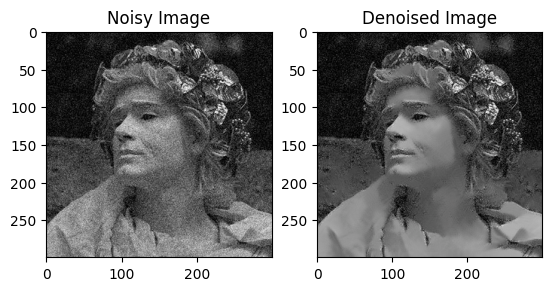

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/noisy image.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Denoising using Non-Local Means Denoising
denoised = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

# Display the images
plt.subplot(1, 2, 1)
plt.title('Noisy Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2)
plt.title('Denoised Image')
plt.imshow(cv2.cvtColor(denoised, cv2.COLOR_BGR2RGB))
plt.show()


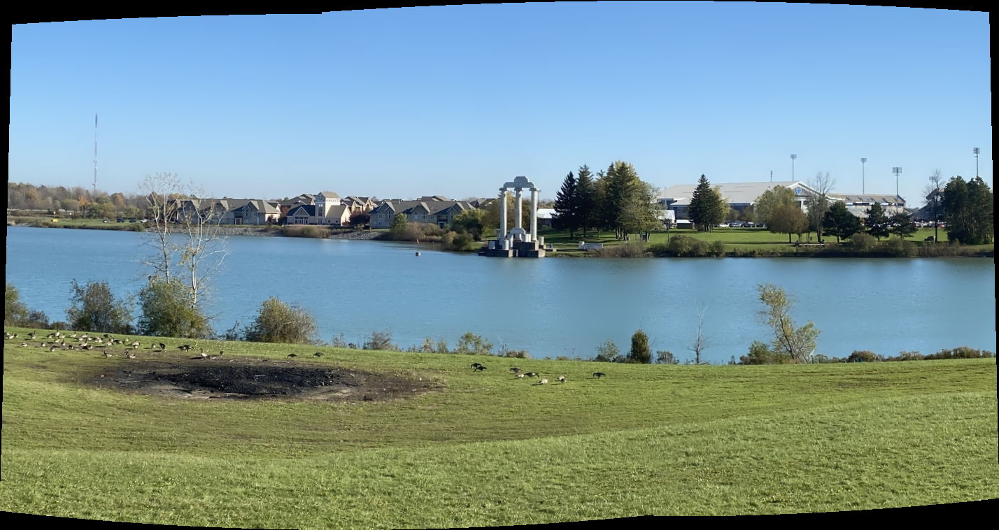

In [3]:
from google.colab.patches import cv2_imshow

# Load images (ensure overlap and same scene)
imgs = [cv2.imread('/content/l1.jpg'), cv2.imread('/content/l2.jpg')]

stitcher = cv2.Stitcher_create()
(status, stitched) = stitcher.stitch(imgs)

if status == cv2.Stitcher_OK:
    # cv2.imshow('Panorama', stitched)
    cv2_imshow(stitched)

    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
else:
    print("Error during stitching:", status)


In [4]:
import cv2
import numpy as np

# Load two views
img1 = cv2.imread('/content/l1.jpg', 0)
img2 = cv2.imread('/content/l2.jpg', 0)

# Feature detection and matching
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Ratio test
good = []
for m,n in matches:
    if m.distance < 0.75 * n.distance:
        good.append(m)

# Extract matched points
pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

# Compute fundamental matrix
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_LMEDS)
print("Fundamental Matrix:\n", F)


Fundamental Matrix:
 [[ 3.65143339e-07  7.09684116e-07  1.28270413e-03]
 [ 1.45885915e-06 -1.98777744e-07  9.49729924e-03]
 [-2.26665036e-03 -1.06246731e-02  1.00000000e+00]]


TASK 2

Frame 0


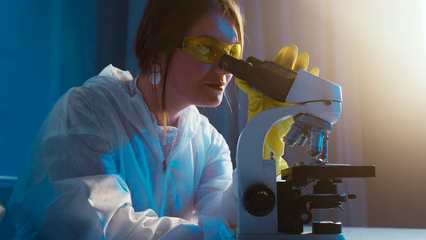

Frame 1


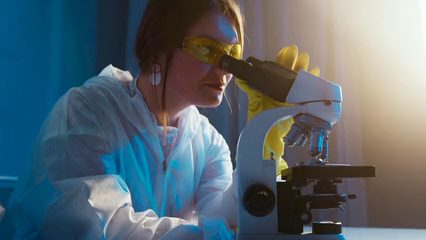

Frame 2


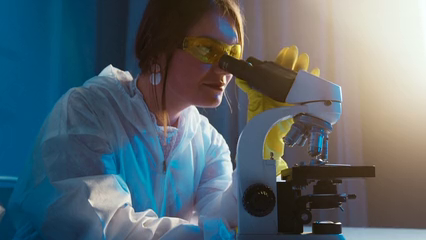

Frame 3


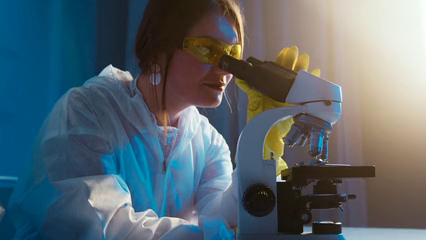

Frame 4


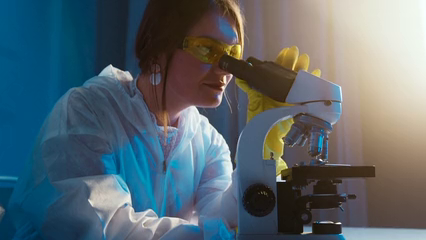

Frame 5


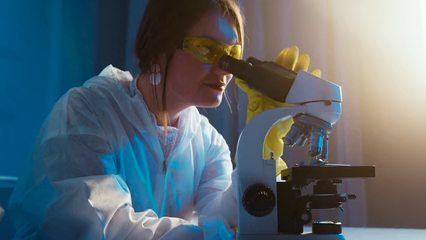

Frame 6


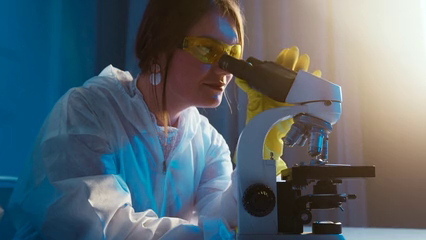

Frame 7


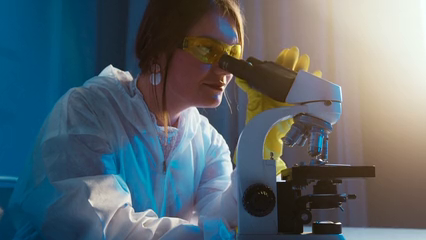

Frame 8


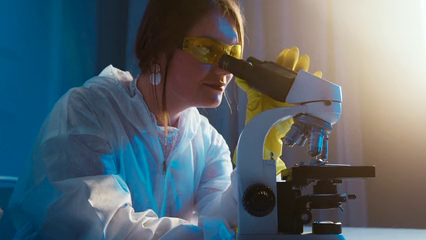

Frame 9


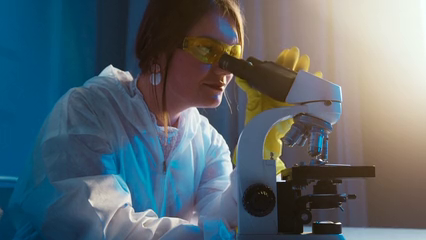

Frame 10


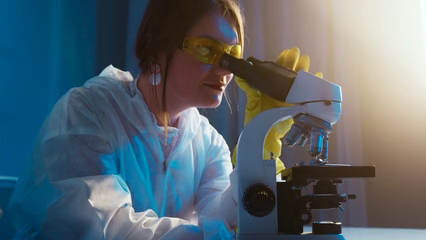

Frame 11


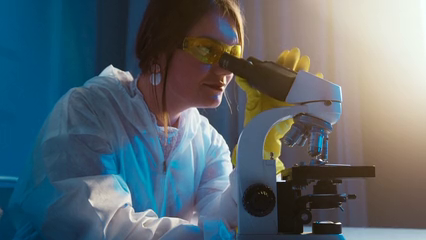

Frame 12


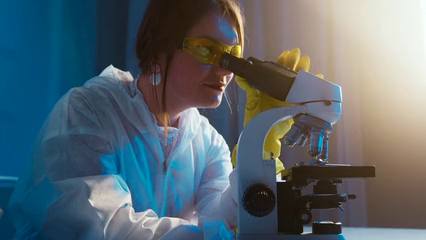

Frame 13


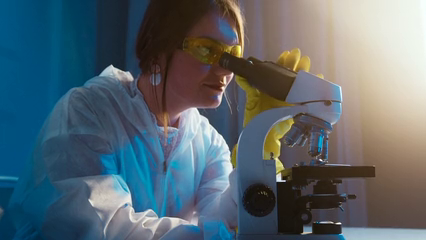

Frame 14


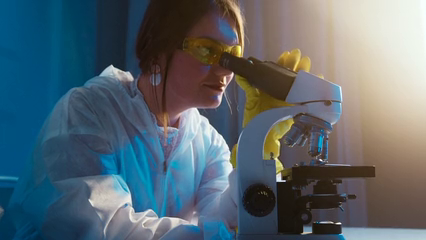

Frame 15


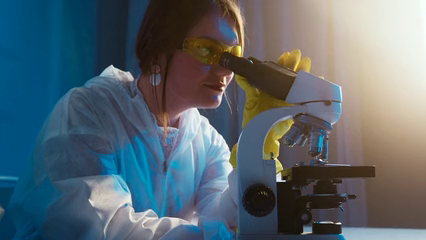

Frame 16


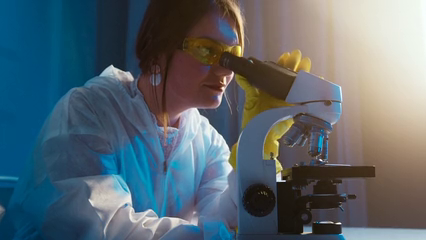

Frame 17


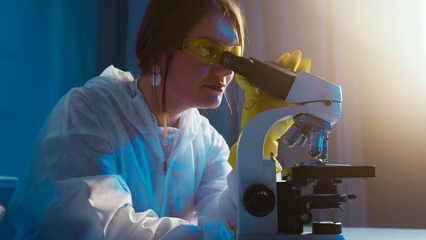

Frame 18


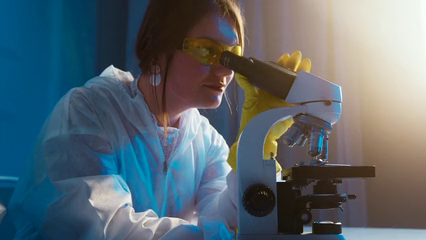

Frame 19


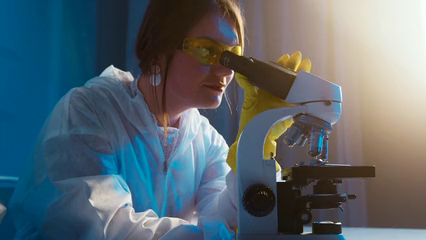

Frame 20


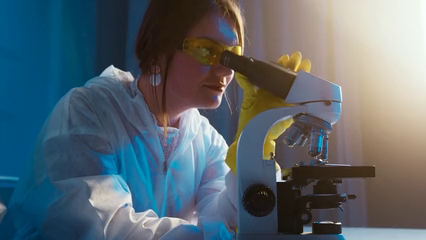

Frame 21


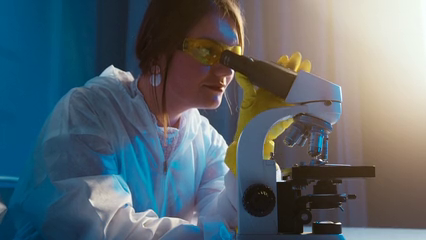

Frame 22


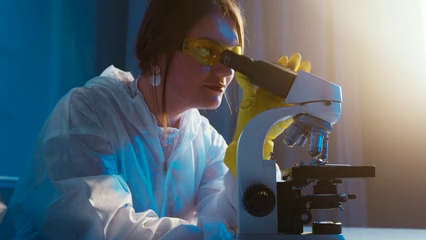

Frame 23


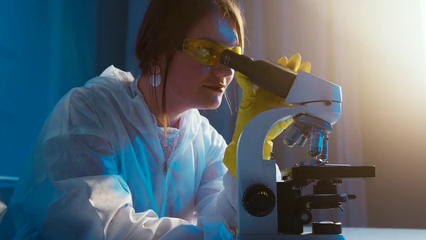

Frame 24


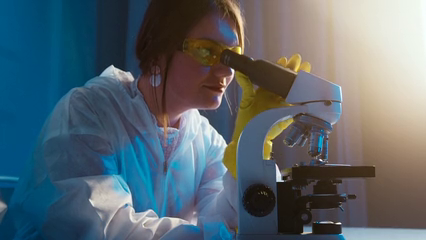

Frame 25


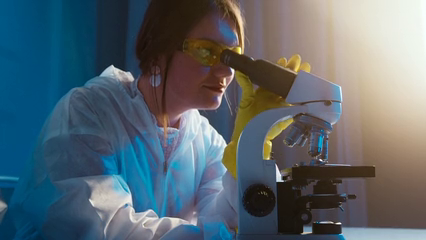

Frame 26


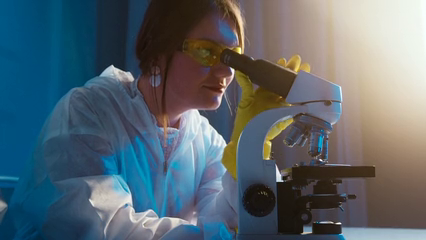

Frame 27


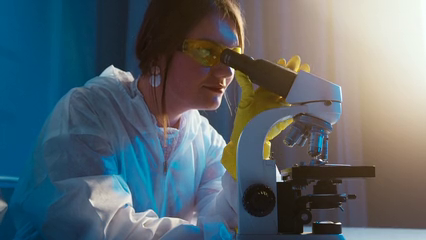

Frame 28


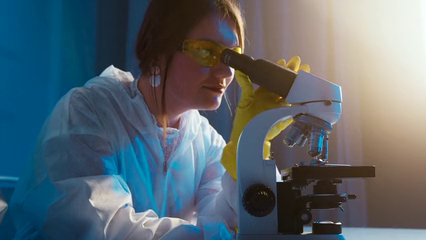

Frame 29


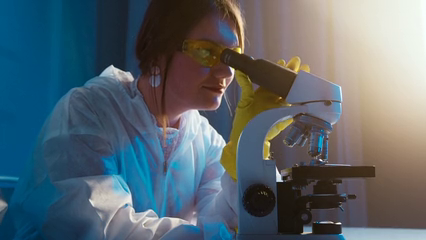

In [18]:
import cv2
from google.colab.patches import cv2_imshow

video_path = '/content/test_07-03_mp4-5752729-uhd_3840_2160_30fps.mp4 (240p).mp4'
cap = cv2.VideoCapture(video_path)

frame_count = 0
max_frames = 30

while cap.isOpened() and frame_count < max_frames:
    ret, frame = cap.read()
    if not ret:
        break

    print(f"Frame {frame_count}")
    cv2_imshow(frame)
    frame_count += 1

cap.release()


Frame 0 - Spatial Blur


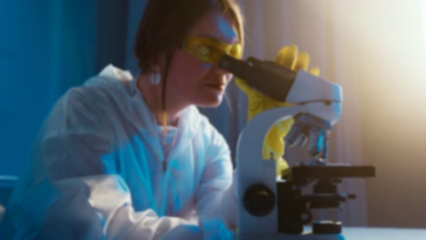

Frame 0 - Frequency Spectrum


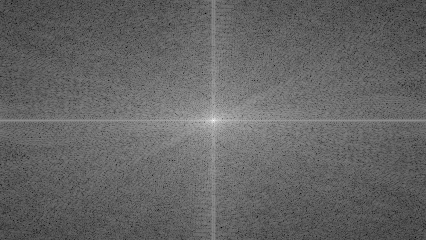

Frame 1 - Spatial Blur


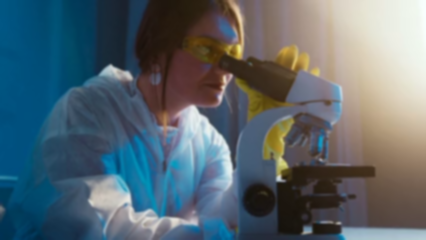

Frame 1 - Frequency Spectrum


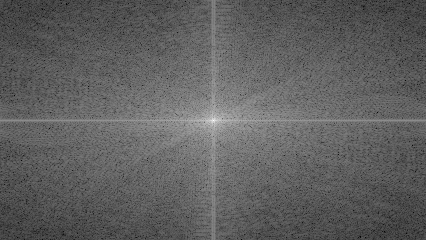

Frame 2 - Spatial Blur


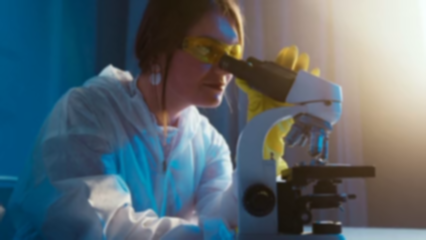

Frame 2 - Frequency Spectrum


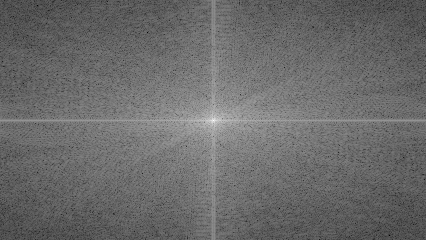

Frame 3 - Spatial Blur


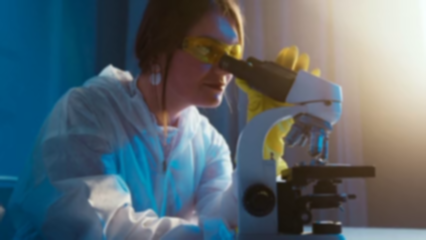

Frame 3 - Frequency Spectrum


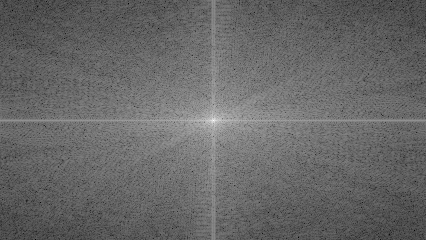

Frame 4 - Spatial Blur


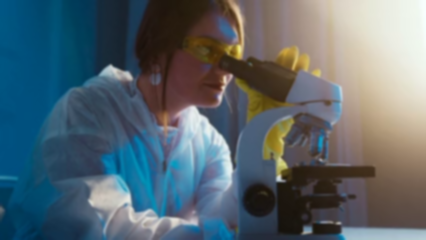

Frame 4 - Frequency Spectrum


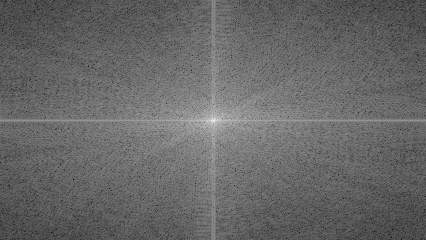

Frame 5 - Spatial Blur


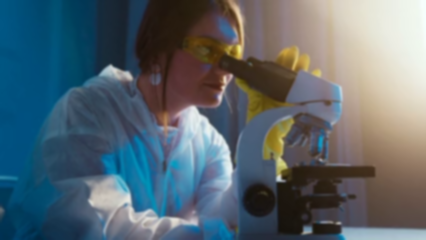

Frame 5 - Frequency Spectrum


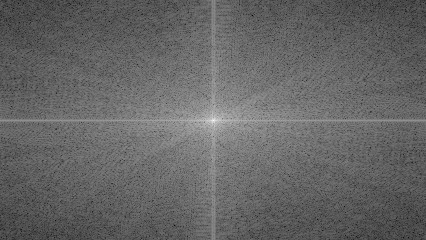

Frame 6 - Spatial Blur


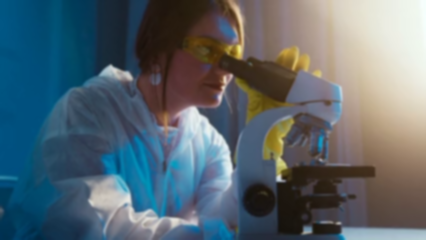

Frame 6 - Frequency Spectrum


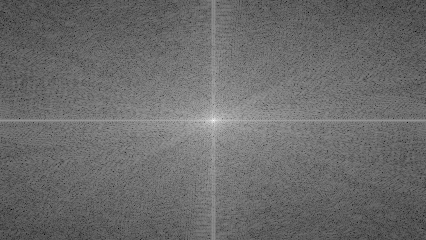

Frame 7 - Spatial Blur


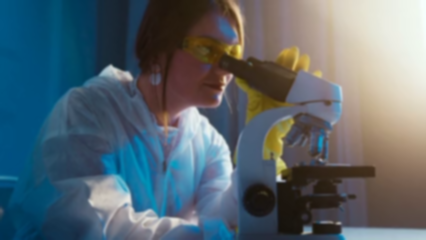

Frame 7 - Frequency Spectrum


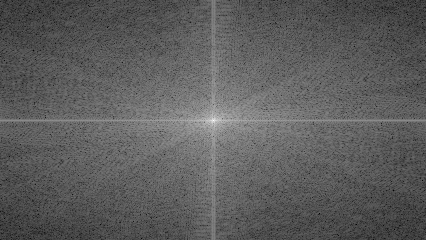

Frame 8 - Spatial Blur


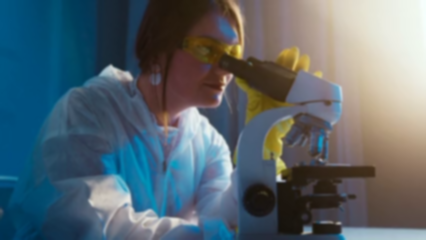

Frame 8 - Frequency Spectrum


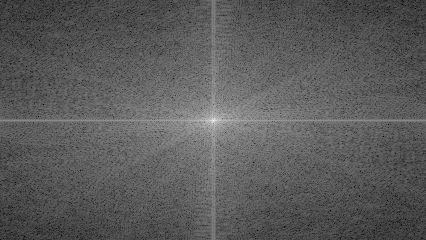

Frame 9 - Spatial Blur


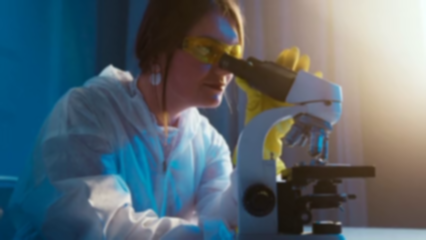

Frame 9 - Frequency Spectrum


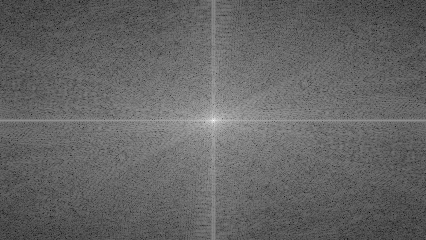

In [19]:
import numpy as np
cap = cv2.VideoCapture(video_path)

frame_count = 0
max_frames = 10

while cap.isOpened() and frame_count < max_frames:
    ret, frame = cap.read()
    if not ret:
        break

    # Spatial Domain: Gaussian Blur
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)

    # Frequency Domain: FFT
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

    mag_img = cv2.normalize(magnitude_spectrum, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    print(f"Frame {frame_count} - Spatial Blur")
    cv2_imshow(blurred)

    print(f"Frame {frame_count} - Frequency Spectrum")
    cv2_imshow(mag_img)

    frame_count += 1

cap.release()


Frame 0 - Foreground Mask


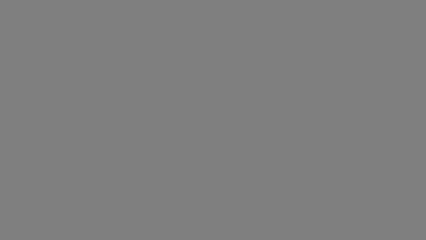

Frame 1 - Foreground Mask


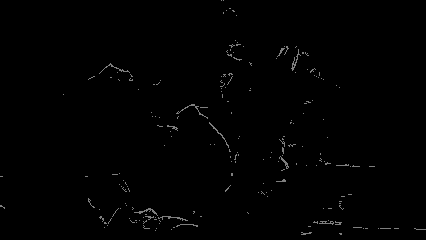

Frame 2 - Foreground Mask


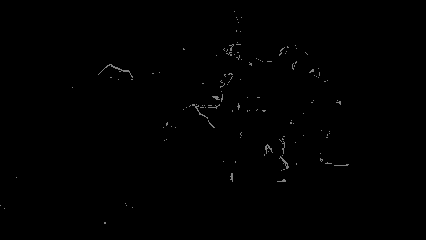

Frame 3 - Foreground Mask


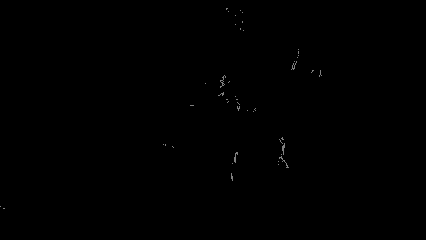

Frame 4 - Foreground Mask


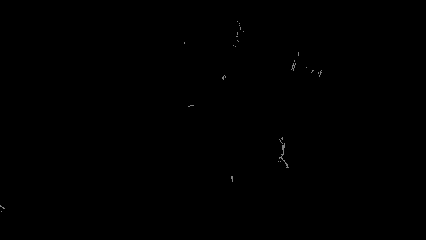

Frame 5 - Foreground Mask


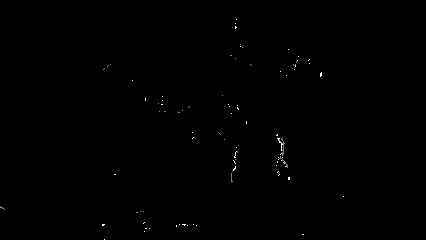

Frame 6 - Foreground Mask


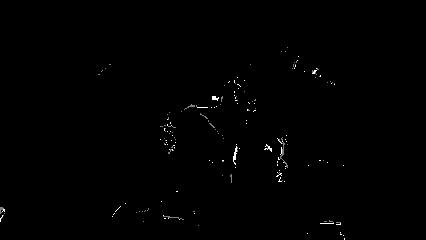

Frame 7 - Foreground Mask


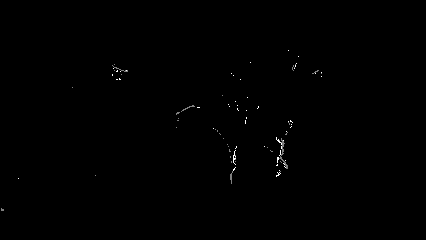

Frame 8 - Foreground Mask


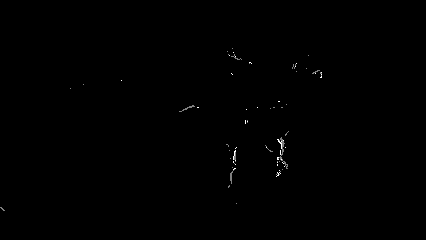

Frame 9 - Foreground Mask


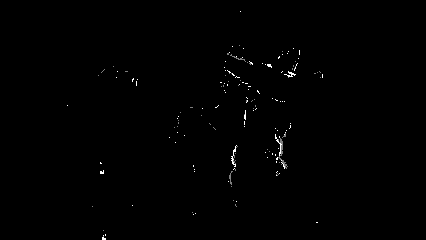

Frame 10 - Foreground Mask


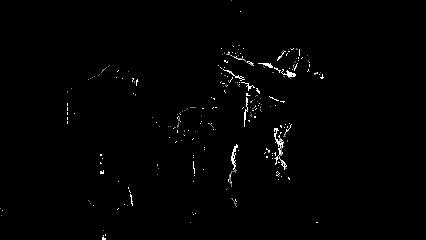

Frame 11 - Foreground Mask


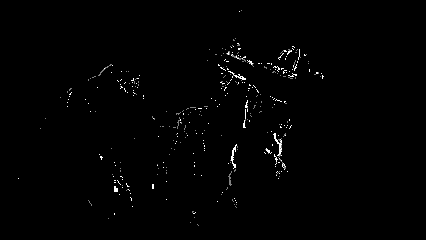

Frame 12 - Foreground Mask


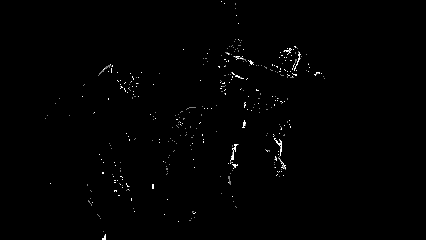

Frame 13 - Foreground Mask


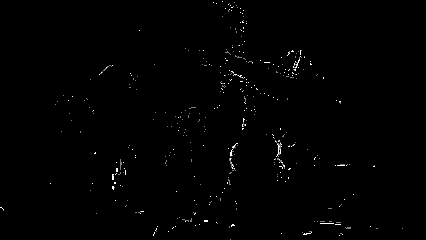

Frame 14 - Foreground Mask


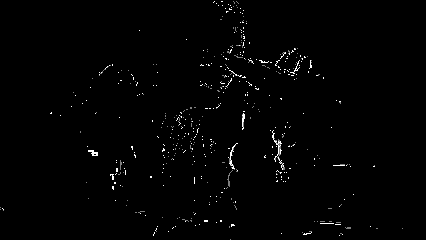

Frame 15 - Foreground Mask


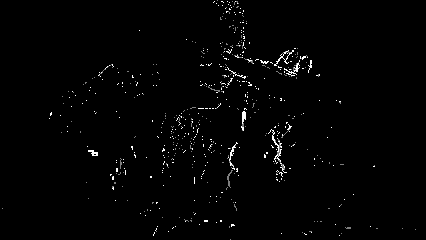

Frame 16 - Foreground Mask


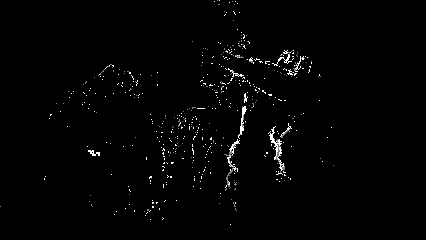

Frame 17 - Foreground Mask


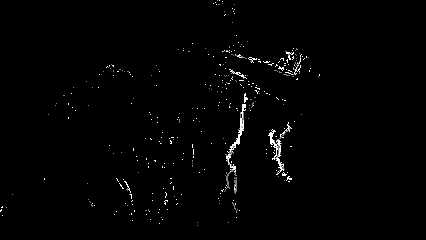

Frame 18 - Foreground Mask


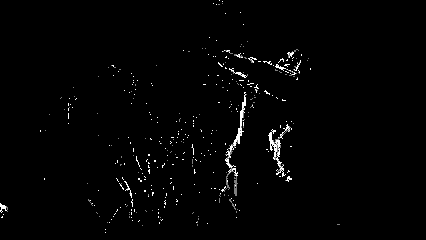

Frame 19 - Foreground Mask


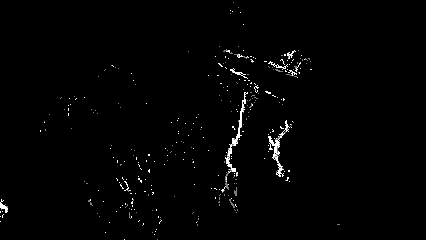

In [20]:
cap = cv2.VideoCapture(video_path)
fgbg = cv2.createBackgroundSubtractorMOG2()

frame_count = 0
max_frames = 20

while cap.isOpened() and frame_count < max_frames:
    ret, frame = cap.read()
    if not ret:
        break

    fg_mask = fgbg.apply(frame)

    print(f"Frame {frame_count} - Foreground Mask")
    cv2_imshow(fg_mask)

    frame_count += 1

cap.release()


Frame 0 - Face Detection


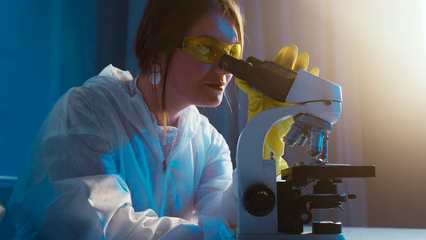

Frame 1 - Face Detection


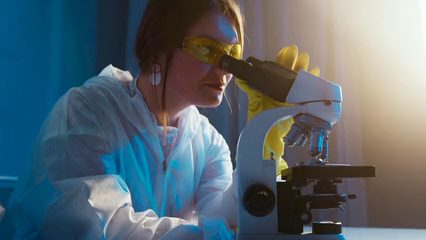

Frame 2 - Face Detection


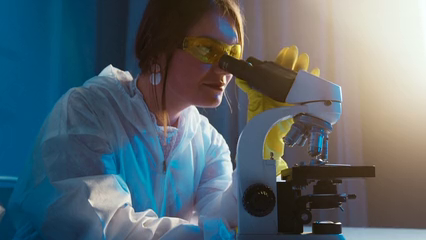

Frame 3 - Face Detection


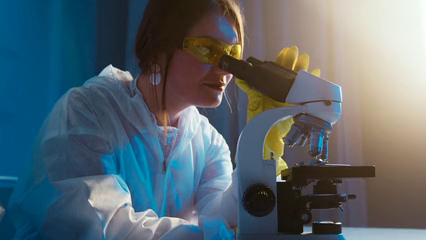

Frame 4 - Face Detection


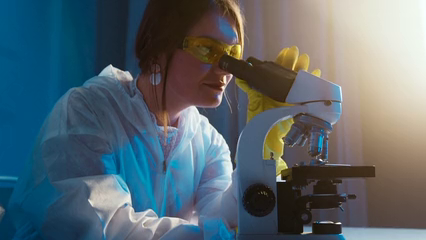

Frame 5 - Face Detection


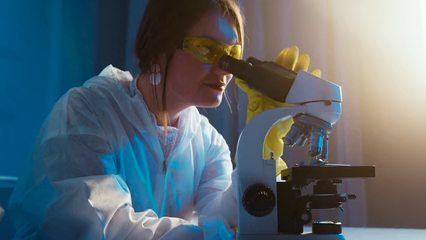

Frame 6 - Face Detection


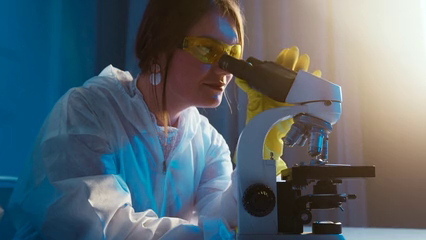

Frame 7 - Face Detection


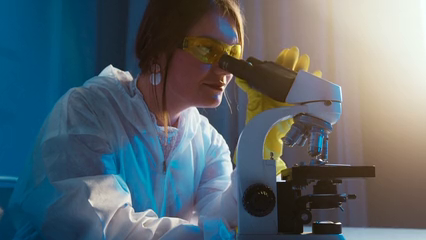

Frame 8 - Face Detection


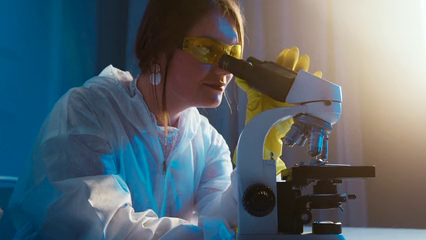

Frame 9 - Face Detection


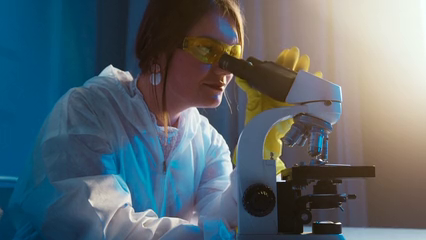

Frame 10 - Face Detection


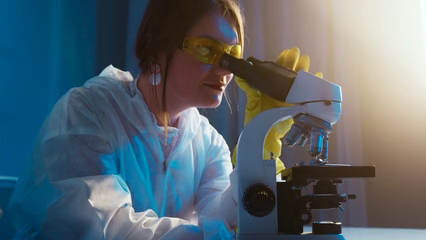

Frame 11 - Face Detection


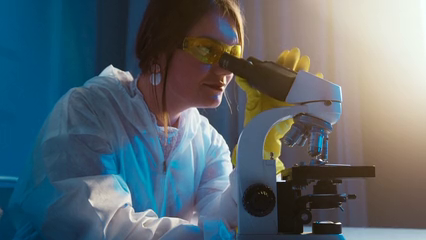

Frame 12 - Face Detection


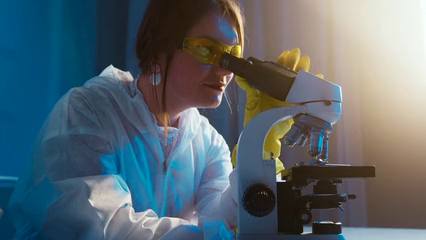

Frame 13 - Face Detection


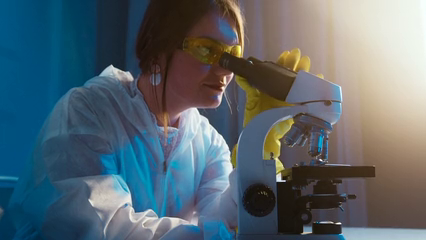

Frame 14 - Face Detection


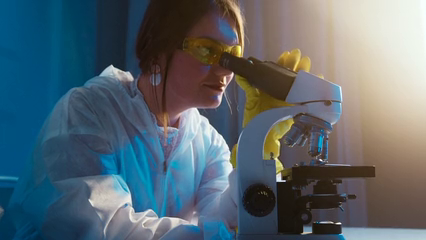

Frame 15 - Face Detection


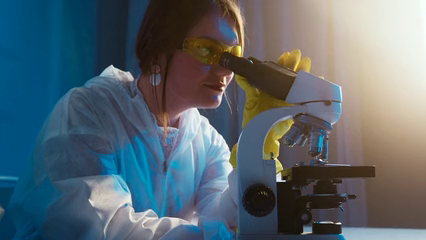

Frame 16 - Face Detection


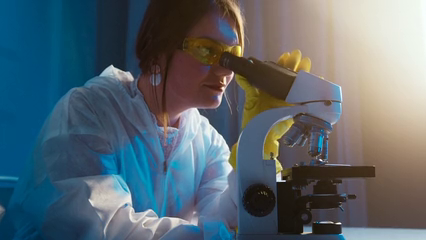

Frame 17 - Face Detection


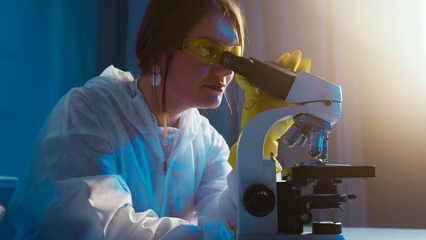

Frame 18 - Face Detection


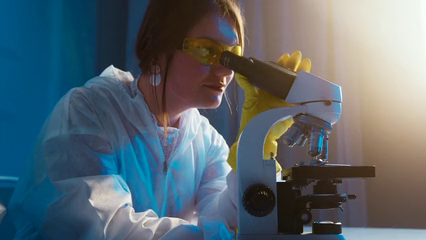

Frame 19 - Face Detection


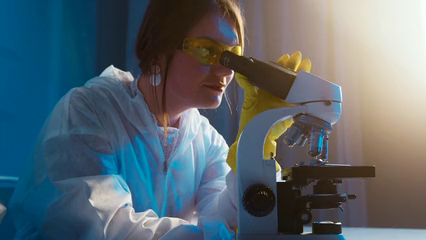

In [21]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
cap = cv2.VideoCapture(video_path)

frame_count = 0
max_frames = 20

while cap.isOpened() and frame_count < max_frames:
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

    print(f"Frame {frame_count} - Face Detection")
    cv2_imshow(frame)

    frame_count += 1

cap.release()
